# Labolatorium 1

Importowanie bibliotek

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
sns.set_palette("bright")

In [3]:
epsilon=[10**(-10), 10**(-14), 10**(-18), 10**(-20)]
determinant=[0,1,2,3]

## Ustawienie zmiennej SAVE_PLOTS na True spowoduje zapisanie wszystkich wykresów w folderze "plots" w katalogu w którym znajduje sie plik

In [4]:
SAVE_PLOTS=True

In [5]:
if SAVE_PLOTS:
    os.makedirs("./plots", exist_ok=True )
    os.makedirs("./plots/Zestaw_danych", exist_ok=True)
    for letter in ['a','b','c','d']:
        os.makedirs("./plots/Dane_" + letter,exist_ok=True)
        for i in range(len(epsilon)):
            os.makedirs("./plots/Dane_" + letter + "/e" + str(i), exist_ok=True)

In [6]:
def matrix_2x2(a,b,c):
    return [[a[0]-c[0], a[1]-c[1]], [ b[0]-c[0], b[1]-c[1]]]

In [7]:
def matrix_3x3(a,b,c):
    return [[a[0],a[1],1],[b[0],b[1],1],[c[0],c[1],1]]

In [8]:
def det_2x2(a,b,c):
    matrix=matrix_2x2(a,b,c)
    return (matrix[0][0]*matrix[1][1])-(matrix[0][1]*matrix[1][0])
def det_3x3(a,b,c):
    matrix=matrix_3x3(a,b,c)
    one = (matrix[0][0]*matrix[1][1]*matrix[2][2])+(matrix[1][0]*matrix[2][1]*matrix[0][2])+(matrix[2][0]*matrix[0][1]*matrix[1][2])
    two = (matrix[0][2]*matrix[1][1]*matrix[2][0])+(matrix[0][1]*matrix[1][0]*matrix[2][2])+(matrix[0][0]*matrix[1][2]*matrix[2][1])
    return one-two


def det_2x2_np(a,b,c):
    matrix=matrix_2x2(a,b,c)
    return np.linalg.det(matrix)
def det_3x3_np(a,b,c):
    matrix=matrix_3x3(a,b,c)
    return np.linalg.det(matrix)

Dla punktów (a,b,c) jeżeli wyznacznik: <br>
<0 punkt C jest po prawej stronie prostej ab <br>
\>0 punkt C jest po lewej stronie prostej ab <br>
=0 punkt znajduje się na prostej ab

# Zadanie 1

1. Przygotuj następujące zbiory punktów (2D, współrzędne rzeczywiste typu double):<br>
a) 10 5 losowych punktów o współrzędnych z przedziału [-1000, 1000], <br>
b) 10 5 losowych punktów o współrzędnych z przedziału [-10 14 , 1014 ],
<br>
c) 1000 losowych punktów leżących na okręgu o środku (0,0) i promieniu R=100,<br>
d) 1000 losowych punktów o współrzędnych z przedziału [-1000, 1000] leżących na prostej 
wyznaczonej przez wektor (a, b),
przyjmij a = [-1.0, 0.0], b = [1.0, 0.1].

### Punkt a)

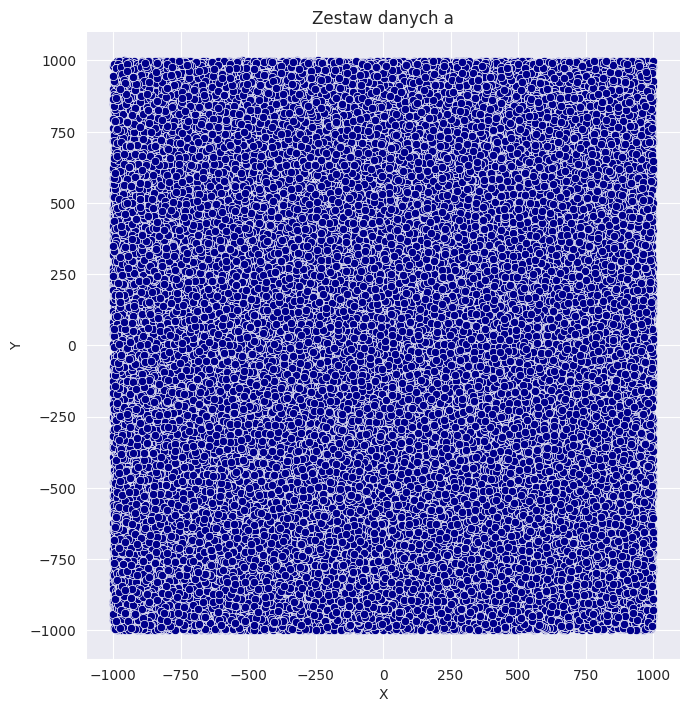

In [9]:
points_a = np.random.uniform(-1000, 1000, size =[10**5, 2])
table_a = pd.DataFrame(data=points_a, columns=['X', 'Y'])
plot_a =sns.relplot(data=table_a ,x='X', y='Y', height=7, color="darkblue").set(title="Zestaw danych a")
if SAVE_PLOTS:
    plot_a.savefig("./plots/Zestaw_danych/Zestaw_danych_a.png")

### Punkt b)

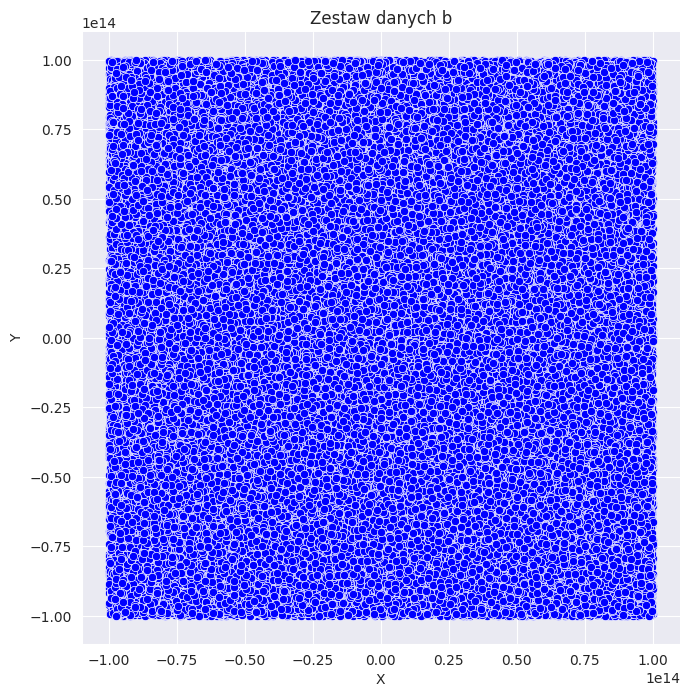

In [10]:
points_b = np.random.uniform(-(10)**14, 10**14, size =[10**5, 2])
table_b = pd.DataFrame(data=points_b, columns=['X', 'Y'])
plot_b =sns.relplot(data=table_b ,x='X', y='Y', height=7, color="blue").set(title="Zestaw danych b")
if SAVE_PLOTS:
    plot_b.savefig("./plots/Zestaw_danych/Zestaw_danych_b.png")

### Punkt c)

In [11]:
points_c=[None for _ in range(1000)]
for i in range(1000):
    angle=np.random.uniform(0,2*np.pi)
    x=np.cos(angle)*100
    y=np.sin(angle)*100
    points_c[i]=(x,y)
table_c=pd.DataFrame(data=points_c, columns=['X','Y'])

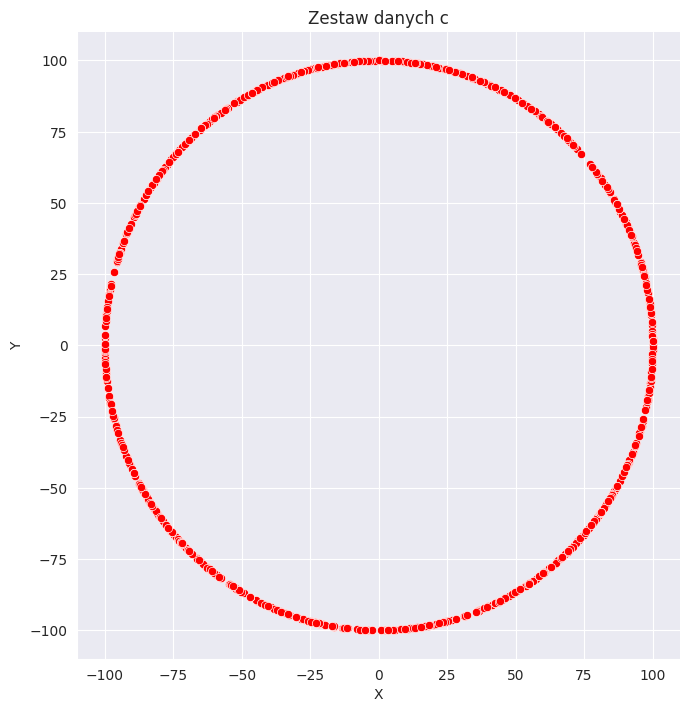

In [12]:
plot_c=sns.relplot(data=table_c, x='X', y='Y', height=7, color="red").set(title="Zestaw danych c")
if SAVE_PLOTS:
    plot_c.savefig("./plots/Zestaw_danych/Zestaw_danych_c.png")

### Punkt d)

In [13]:
points_d=[None for _ in range(1000)]
for i in range(1000):
    x=np.random.uniform(-1000,1000)
    y=0.05 * x + 0.05
    points_d[i]=(x,y)
table_d = pd.DataFrame( data=points_d, columns=['X','Y'])

In [14]:
temp = table_d['X'].loc[table_d.index[1]]

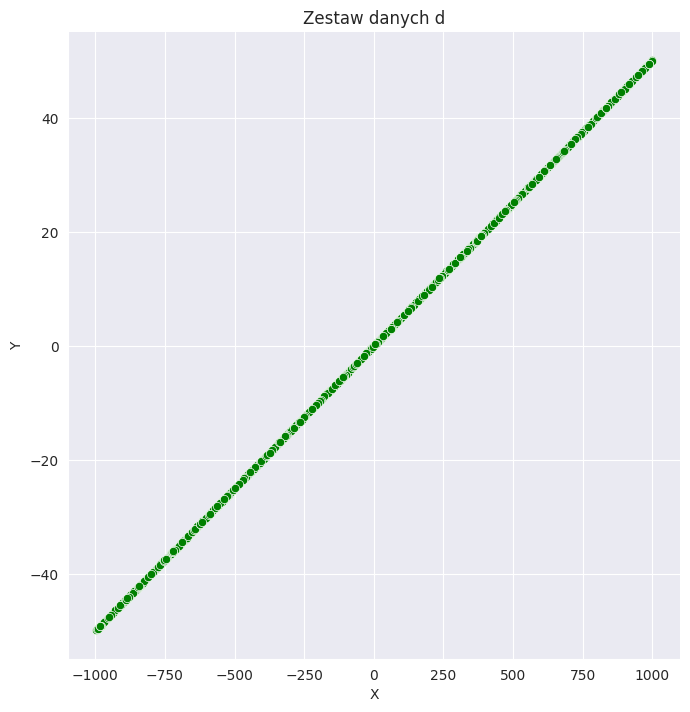

In [15]:
plot_d=sns.relplot(data=table_d, x='X', y='Y', height=7, color="green").set(title="Zestaw danych d")
if SAVE_PLOTS:
    plot_d.savefig("./plots/Zestaw_danych/Zestaw_danych_d.png")

# Zadanie 2

4. Przygotuj program, który dla każdego ze zbioru danych dokona podziału punktów względem ich
orientacji w stosunku do odcinka ab ( a = [-1.0, 0.0], b = [1.0, 0.1] – punkty znajdujące się po
lewej stronie, po prawej stronie oraz współliniowe. Obliczenia wykonaj przy pomocy
wyznacznika (1) i następnie (2) zaimplementowanego samodzielnie. Wyszukaj w bibliotekach
numerycznych procedury obliczania wyznacznika 3x3 i 2x2. Dla każdego zbioru danych
porównaj wyniki (podział punktów) uzyskane przy pomocy obu wyznaczników wyliczanych
procedurami własnymi i bibliotecznymi. Określ, ile punktów (i jakich) zostało inaczej
zakwalifikowanych dla różnych sposobów liczenia wyznacznika. Zbadaj wyniki dla różnej
tolerancji dla zera oraz różnych precyzji obliczeń. Odpowiednio zaprezentuj otrzymane wyniki
w tabelach.

In [16]:
def where_is_point(a,b,c,det,epsilon):
    if det==0:
        determinant=det_2x2(a,b,c)
    elif det==1:
        determinant=det_3x3(a,b,c)
    elif det==2:
        determinant=det_2x2_np(a,b,c)
    else:
        determinant=det_3x3_np(a,b,c)
        
    if determinant>epsilon:
        return "lewo"
    if determinant<-1*epsilon:
        return "prawo"
    return "środek"

In [17]:
def categorize(example,det,epsilon):
    a=(-1.0, 0.0)
    b=(1.0, 0.1)
    left=0
    right=0
    center=0    
    
    lenght = len(example.index)
    place=[None for _ in range(lenght)]
    for i in range(lenght):
        x=example['X'].loc[example.index[i]]
        y=example['Y'].loc[example.index[i]]
        place[i]=where_is_point(a,b,(x,y),det,epsilon)
        if place[i]=="lewo":
            left+=1
        elif place[i]=="prawo":
            right+=1
        else:
            center+=1
        
    example["Punkty"]=place
    return example, left, right, center

In [18]:
def which_det(i):
    if i==0:
        return "det_2x2"
    if i==1:
        return "det_3x3"
    if i==2:
        return "Numpy_det_2x2"
    return "Numpy_det_3x3"

In [19]:
def make_plots(where, table):
    
    for i in range(len(epsilon)):
        Summary=pd.DataFrame({'Punkty': ["lewo","prawo","środek"]})
        left=0
        right=0
        center=0
        
        for det in determinant:
            data_xyz, left, right, center=categorize(table, det, epsilon[i])

            rows=which_det(det)
            Summary[rows]=[left,right,center]
            plot_a=sns.relplot(data=data_xyz, x='X', y='Y', hue="Punkty", height=6).set(title="Dokładność: " + str(epsilon[i])+  "  Wyznacznik: " + str(rows))

            if SAVE_PLOTS:
                file_name=where + "_e" + str(i) + "_d" + str(det) +".png"
                place="./plots/" + where + "/e"  + str(i) + "/"
                plot_a.savefig(place+file_name)
                
        Summary.to_csv("Summary_e" + str(i)+ ".csv", index=False)

## Zestaw danych A:

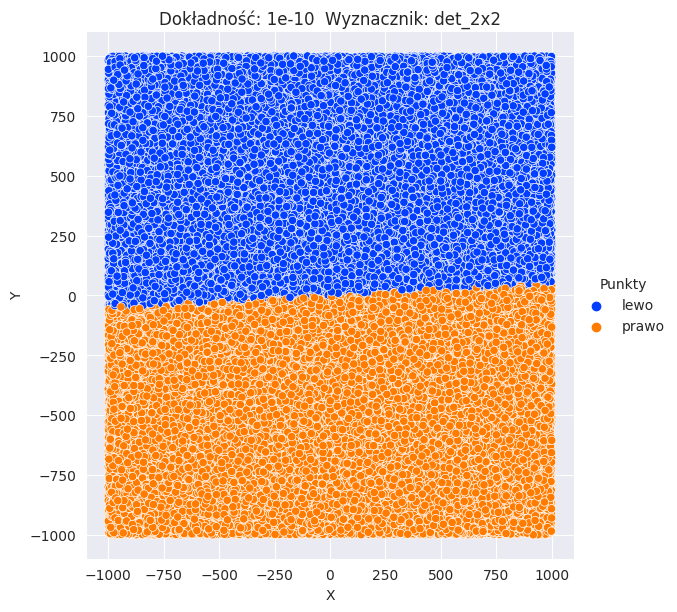

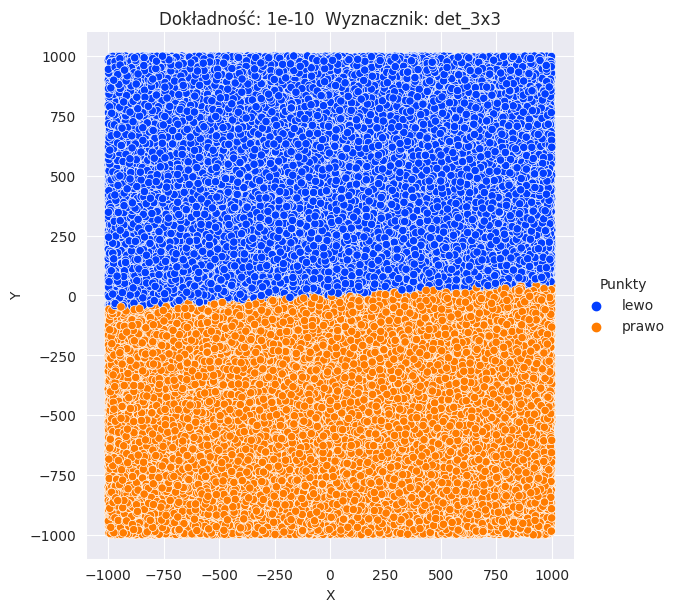

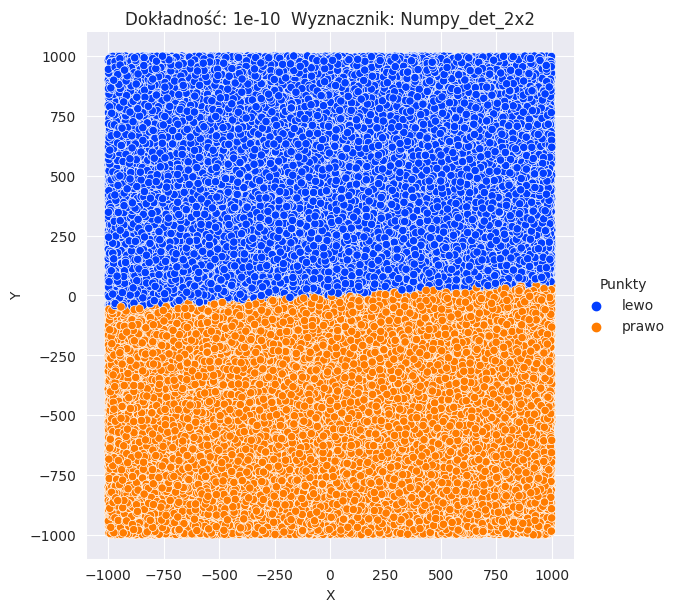

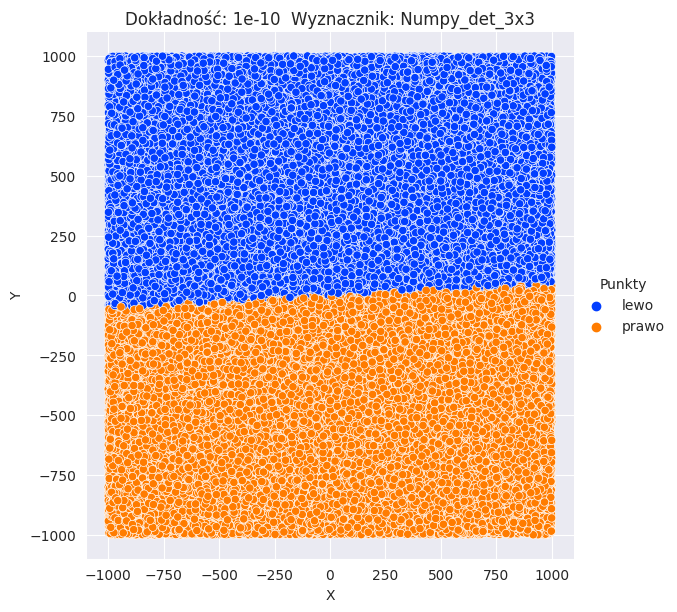

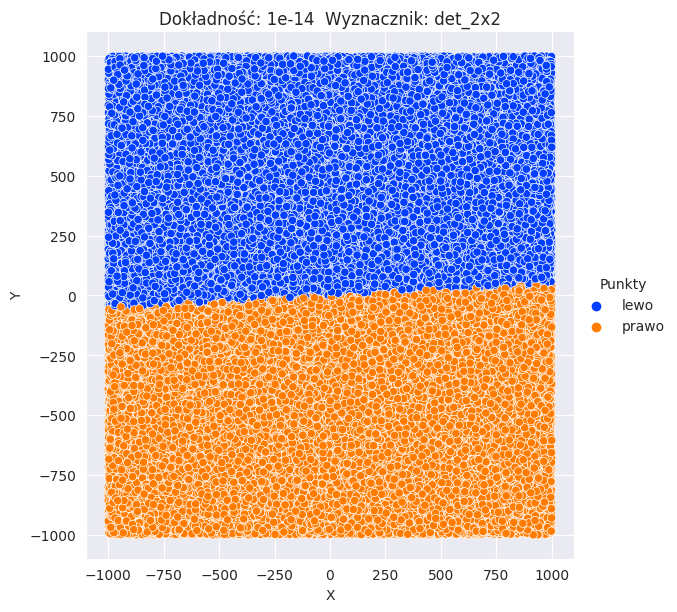

...

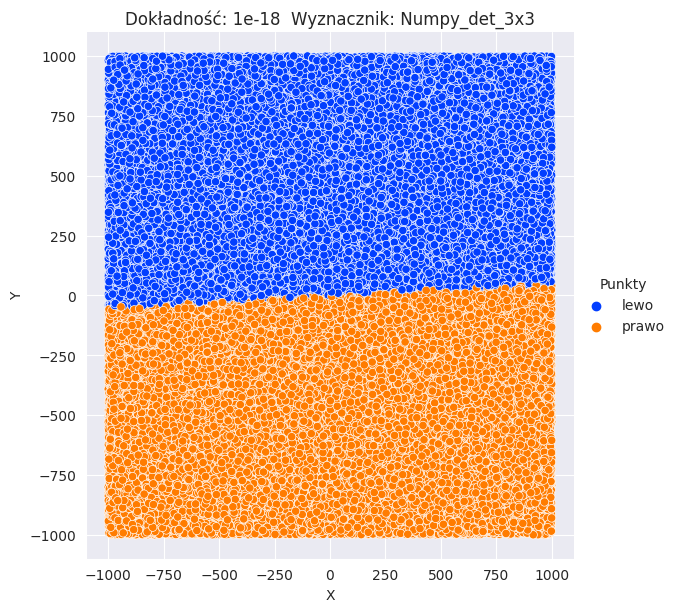

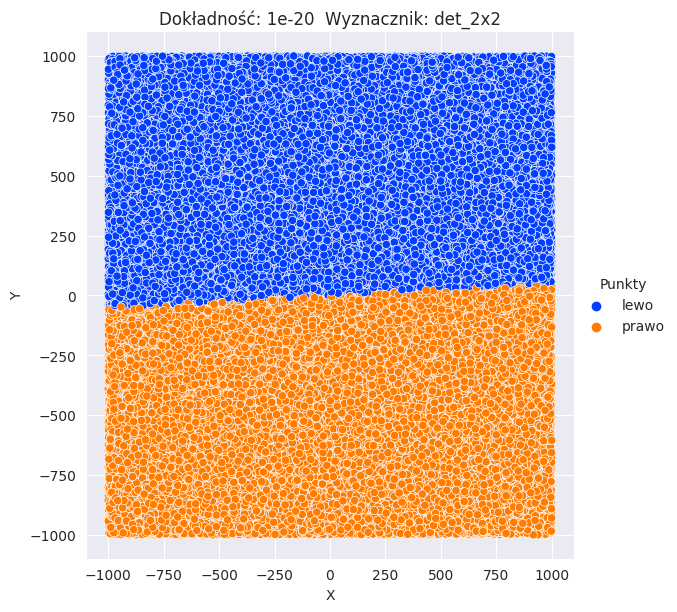

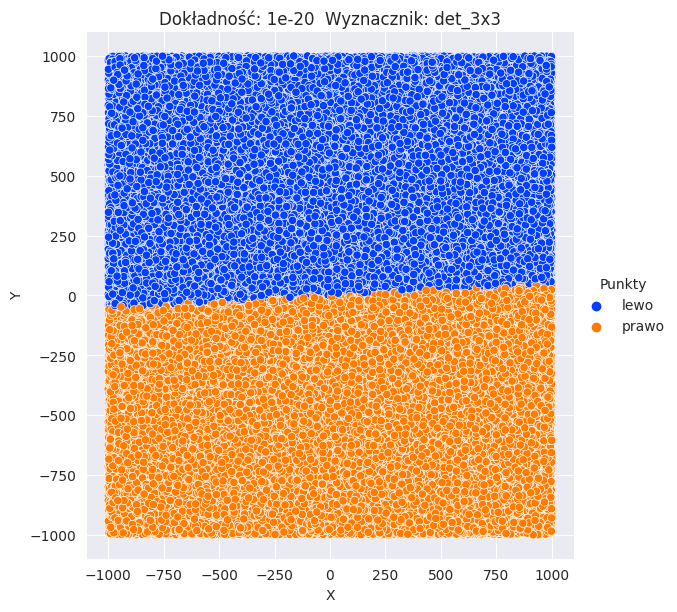

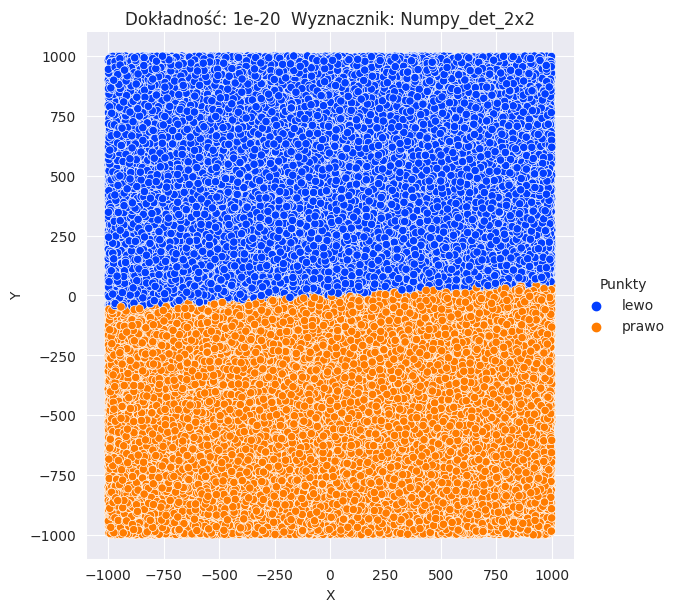

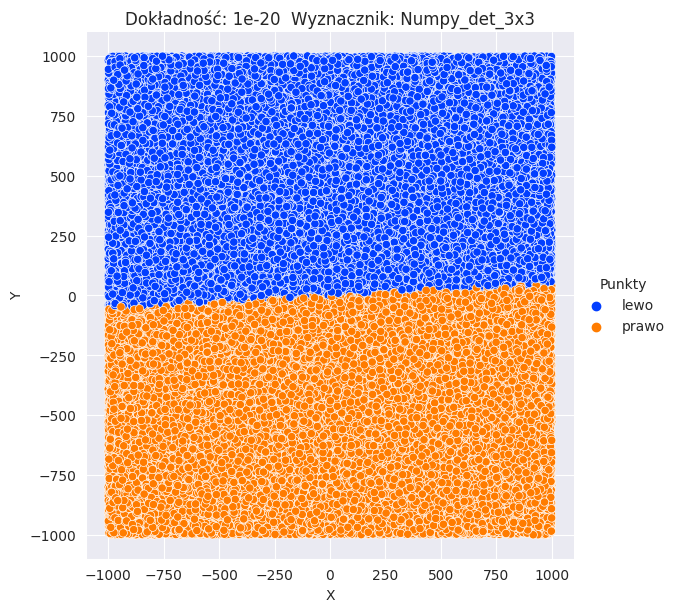

In [36]:
make_plots("Dane_a", table_a)

In [37]:
for i in range(len(epsilon)):
    df = pd.read_csv("Summary_e" + str(i)+ ".csv", index_col='Punkty')
    print(df.head())
    print()
    os.system("rm Summary_e" + str(i) + ".csv")

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      49618    49618          49618          49618
prawo     50382    50382          50382          50382
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      49618    49618          49618          49618
prawo     50382    50382          50382          50382
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      49618    49618          49618          49618
prawo     50382    50382          50382          50382
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      49618    49618          49618          49618
prawo  

## Zestaw danych B:

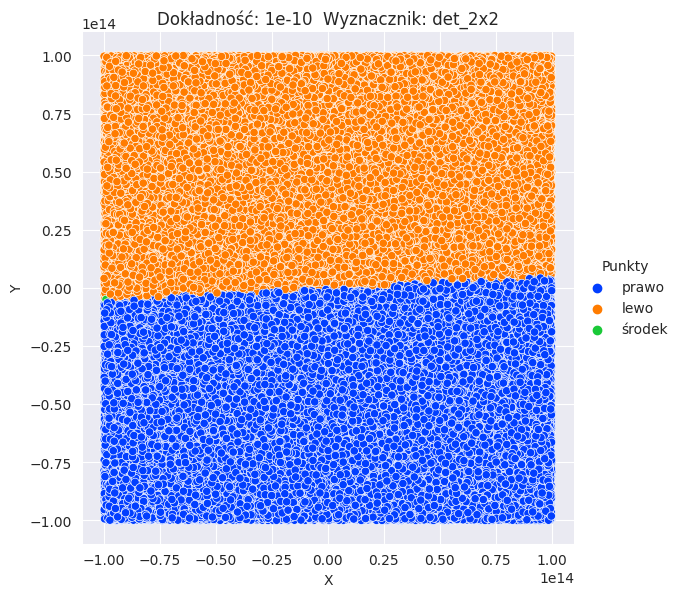

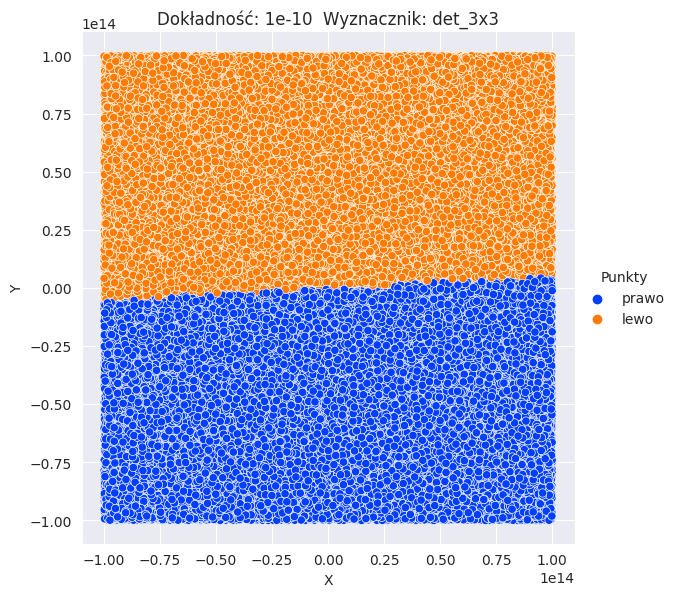

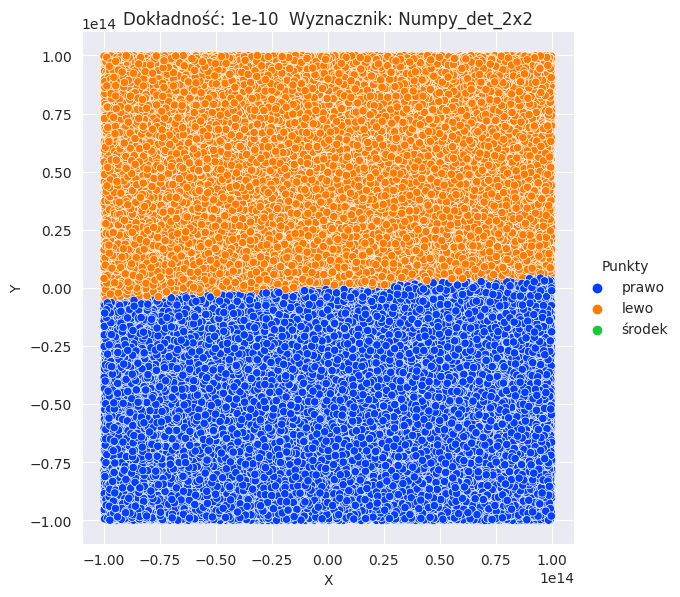

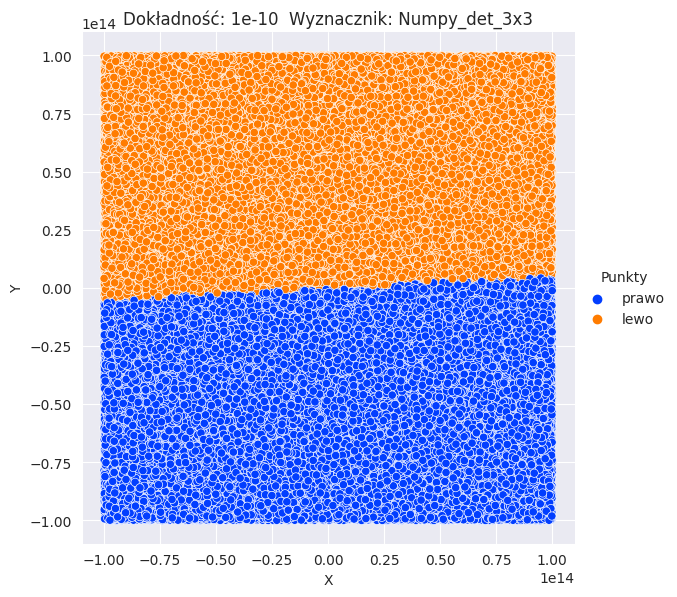

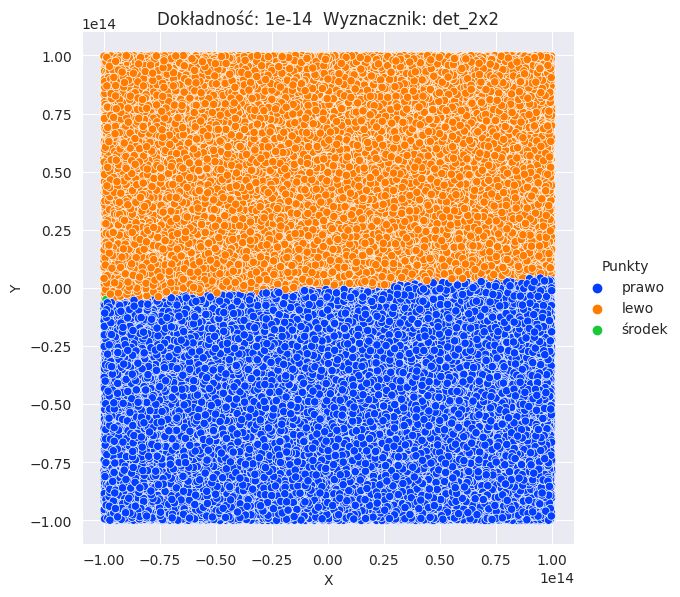

...

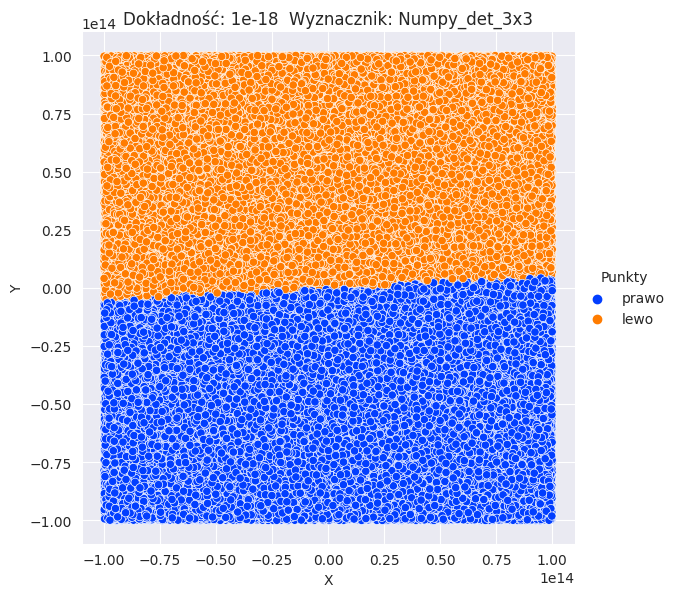

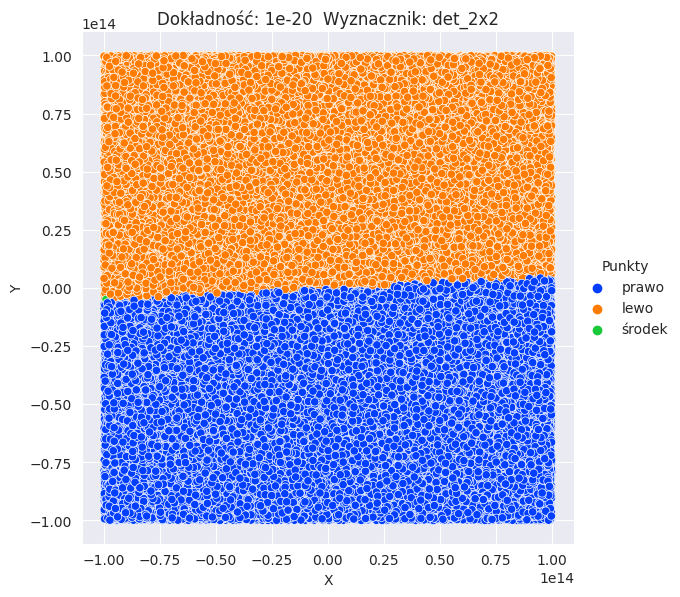

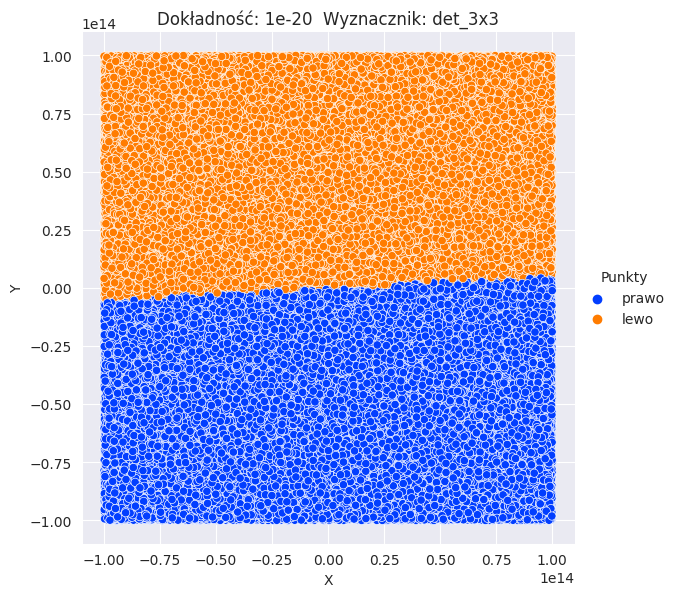

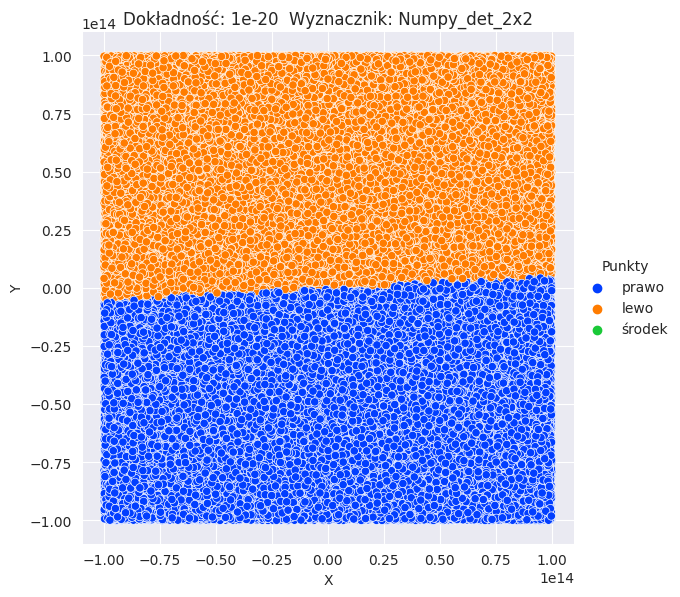

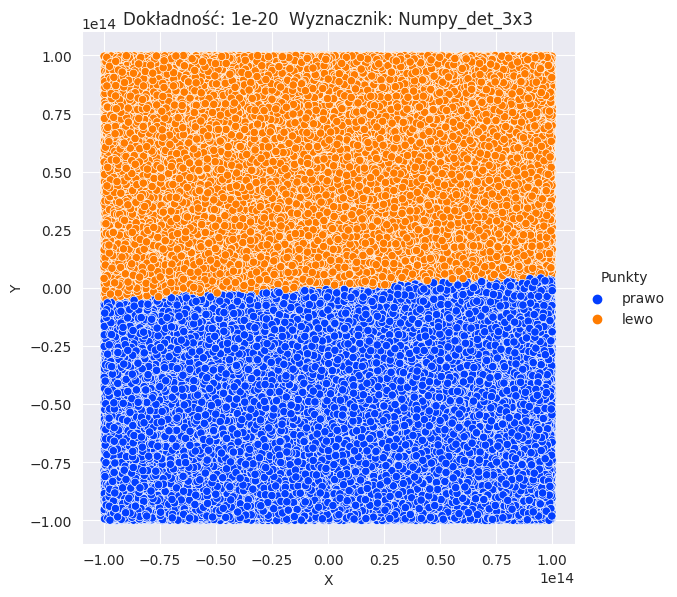

In [38]:
make_plots("Dane_b", table_b)

In [39]:
for i in range(len(epsilon)):
    df = pd.read_csv("Summary_e" + str(i)+ ".csv", index_col='Punkty')
    print(df.head())
    print()
    os.system("rm Summary_e" + str(i) + ".csv")

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      50026    50031          50029          50031
prawo     49966    49969          49966          49969
środek        8        0              5              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      50026    50031          50029          50031
prawo     49966    49969          49966          49969
środek        8        0              5              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      50026    50031          50029          50031
prawo     49966    49969          49966          49969
środek        8        0              5              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo      50026    50031          50029          50031
prawo  

## Zestaw danych C:

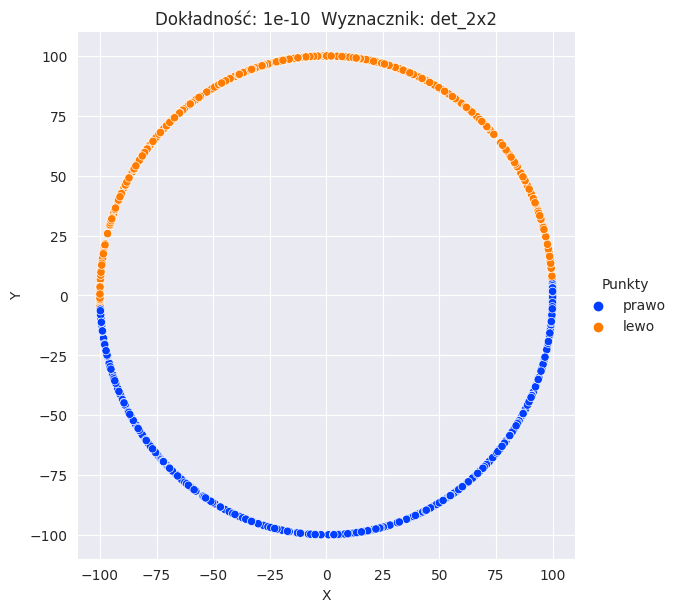

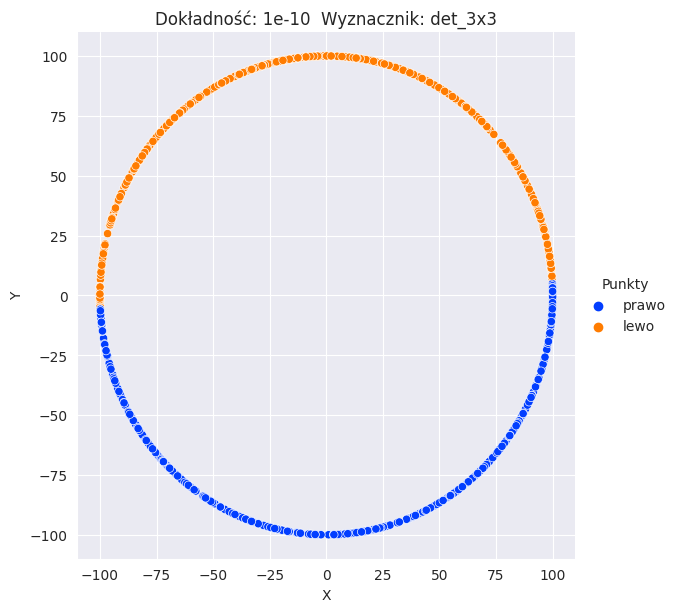

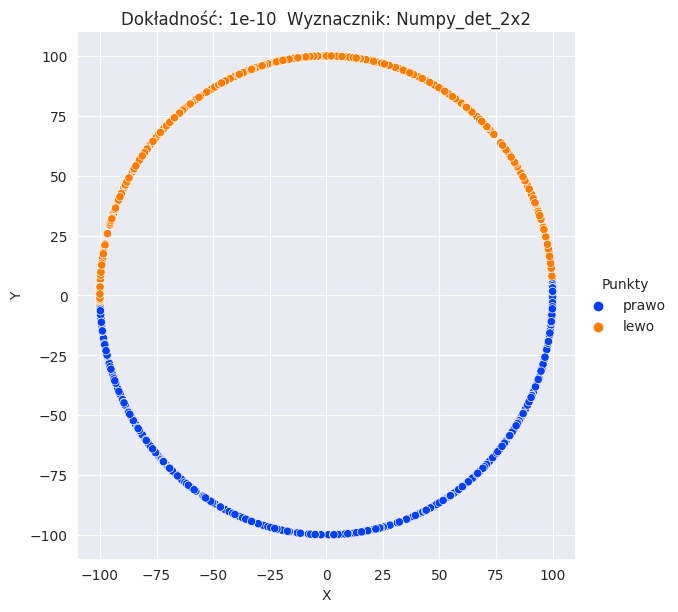

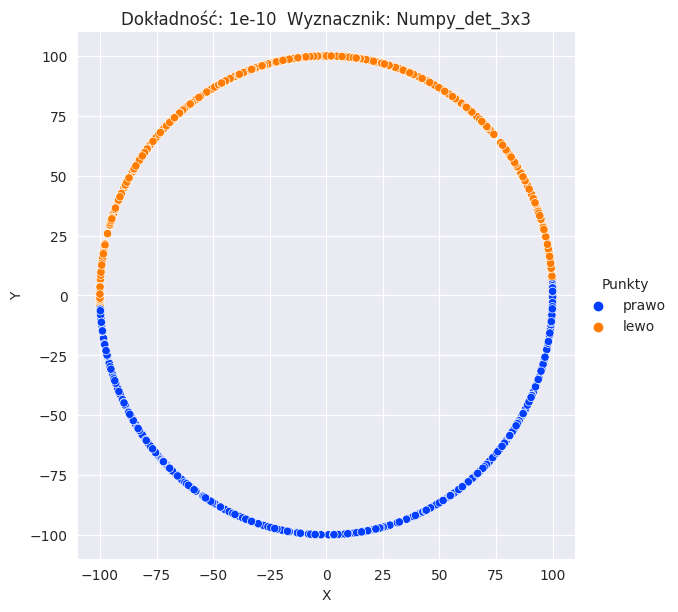

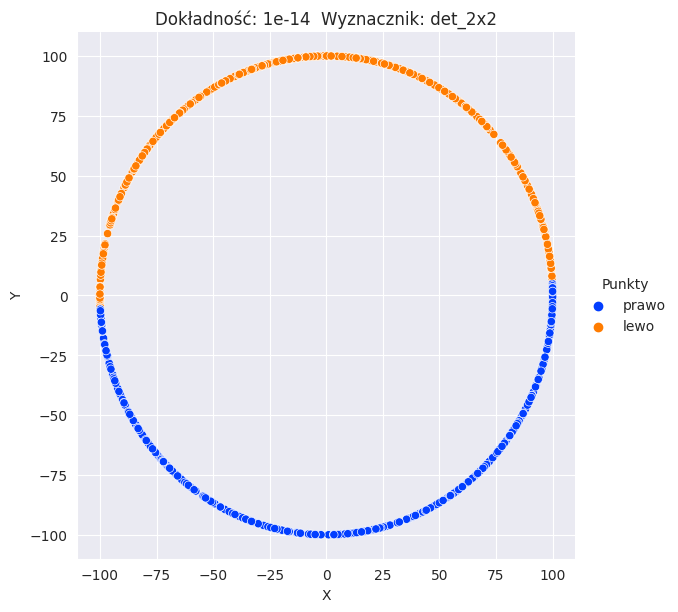

...

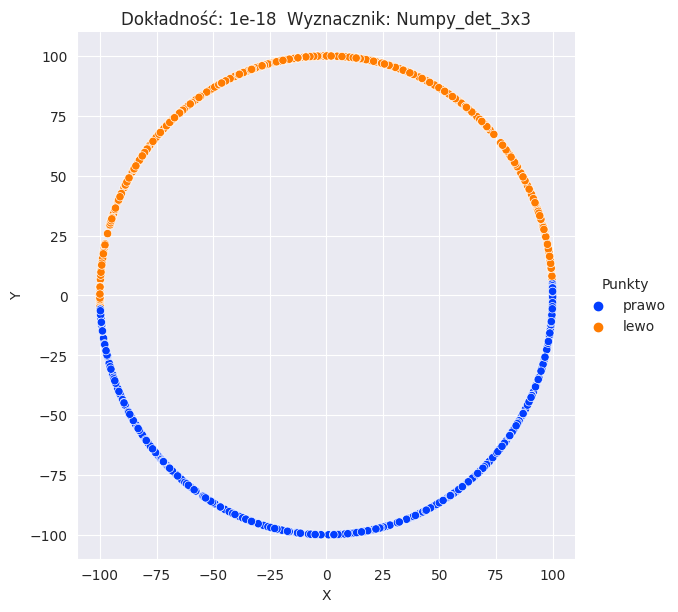

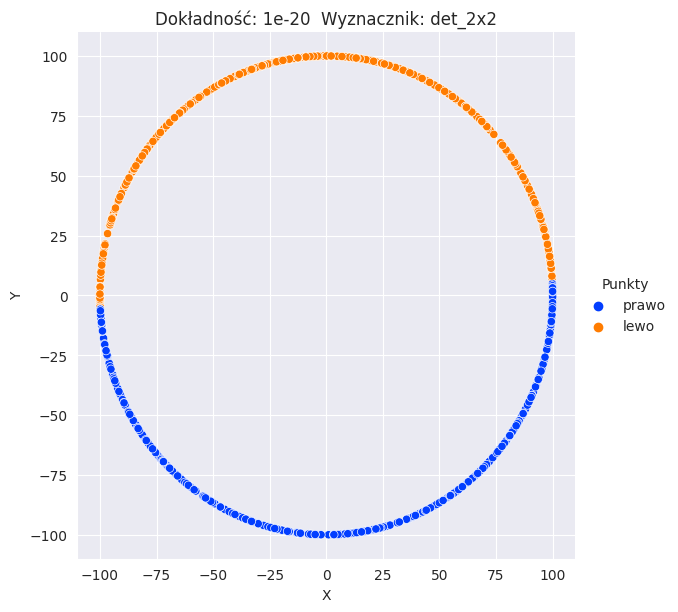

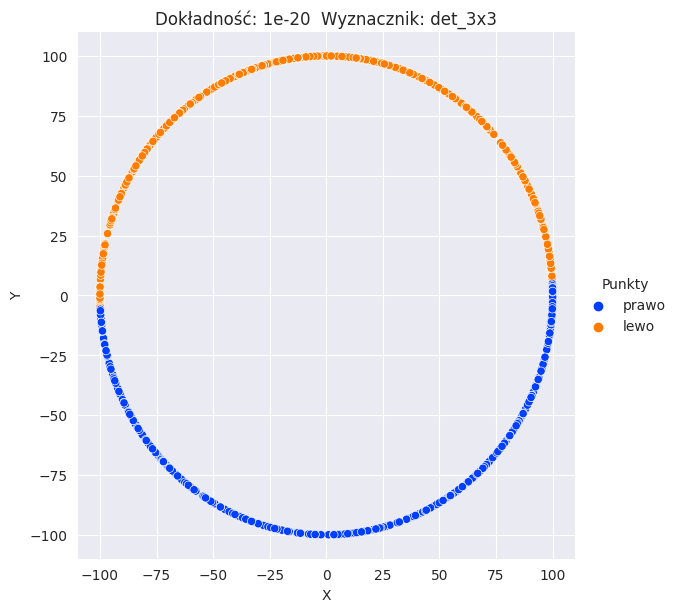

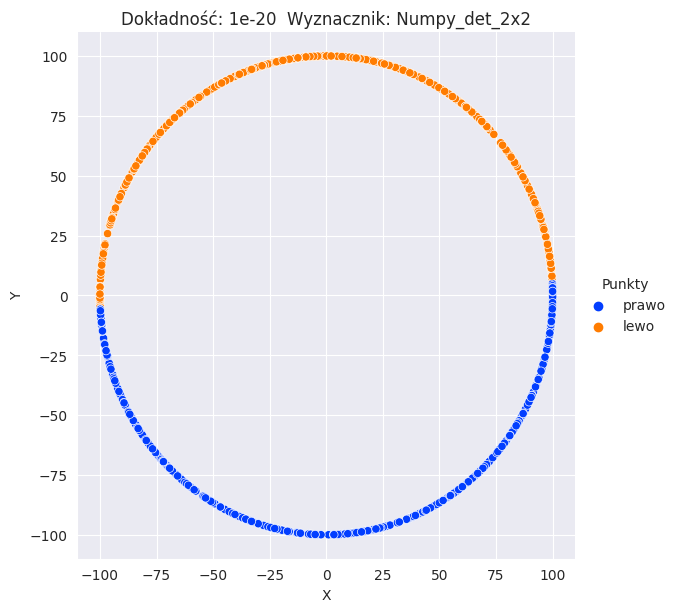

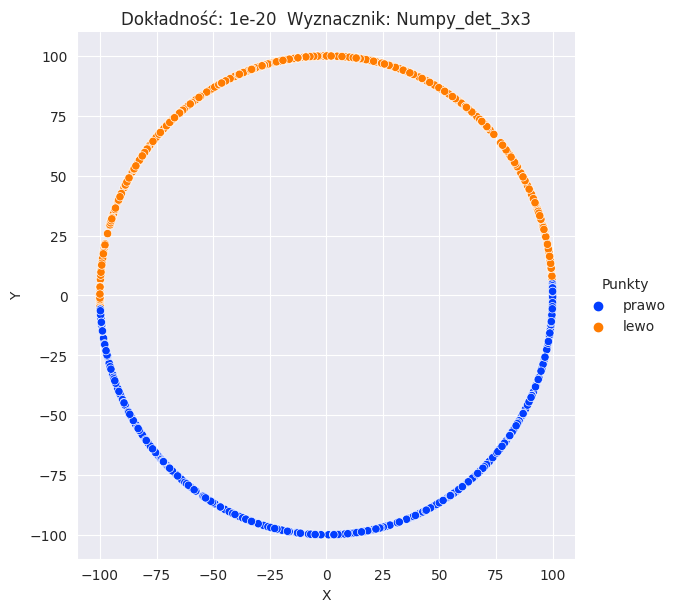

In [40]:
make_plots("Dane_c", table_c)

In [41]:
for i in range(len(epsilon)):
    df = pd.read_csv("Summary_e" + str(i)+ ".csv", index_col='Punkty')
    print(df.head())
    print()
    os.system("rm Summary_e" + str(i) + ".csv")

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        491      491            491            491
prawo       509      509            509            509
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        491      491            491            491
prawo       509      509            509            509
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        491      491            491            491
prawo       509      509            509            509
środek        0        0              0              0

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        491      491            491            491
prawo  

## Zestaw danych D:


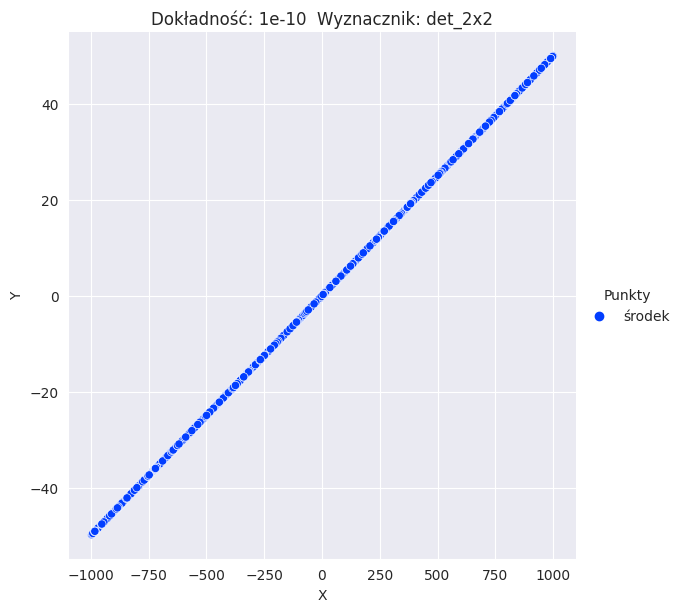

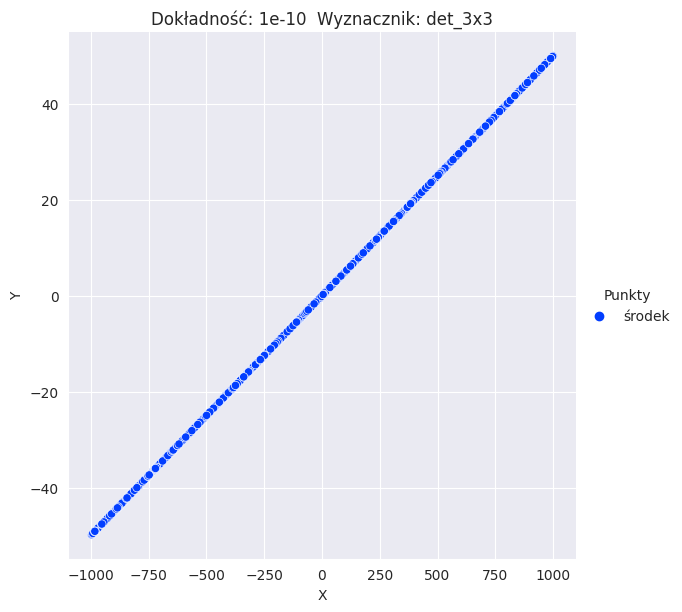

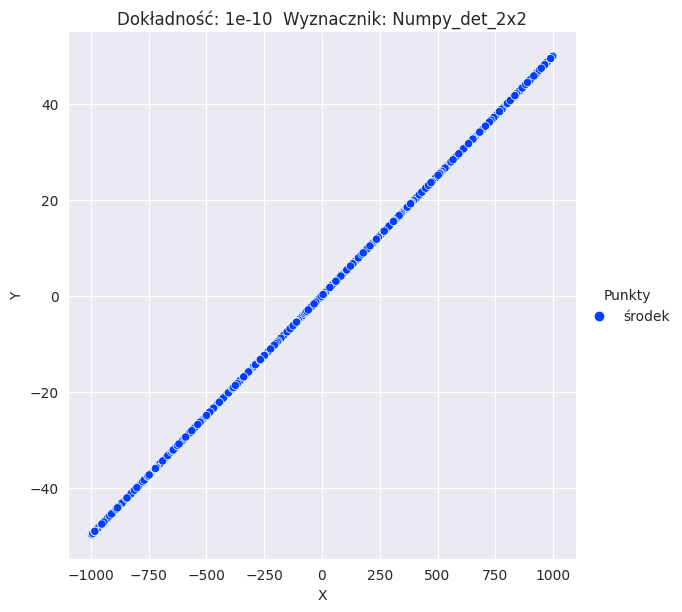

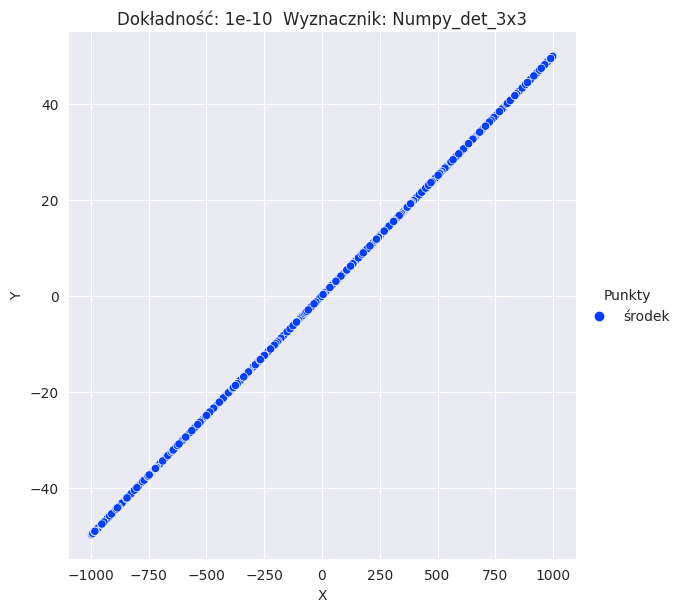

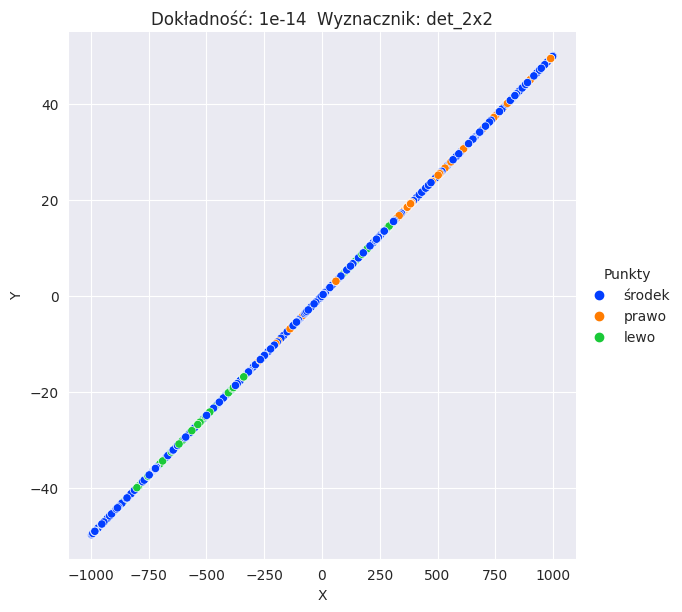

...

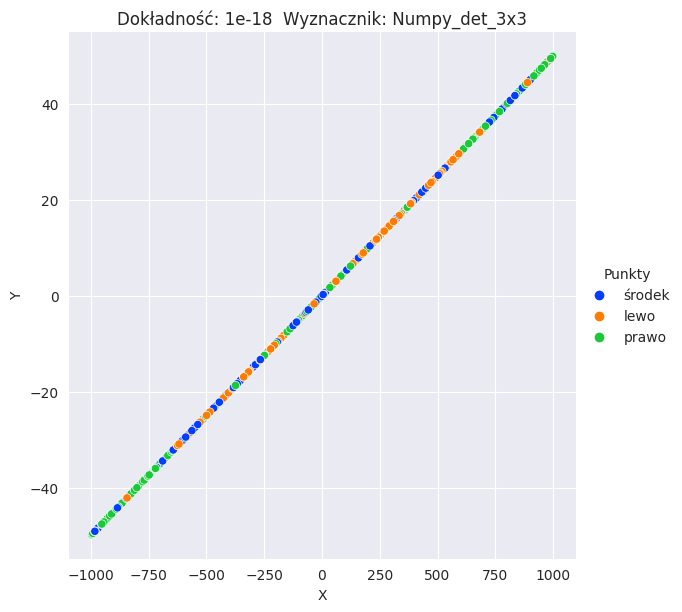

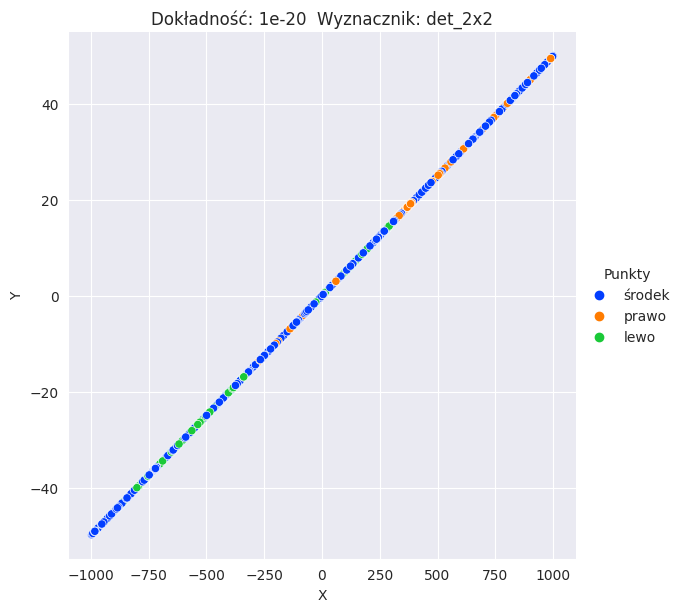

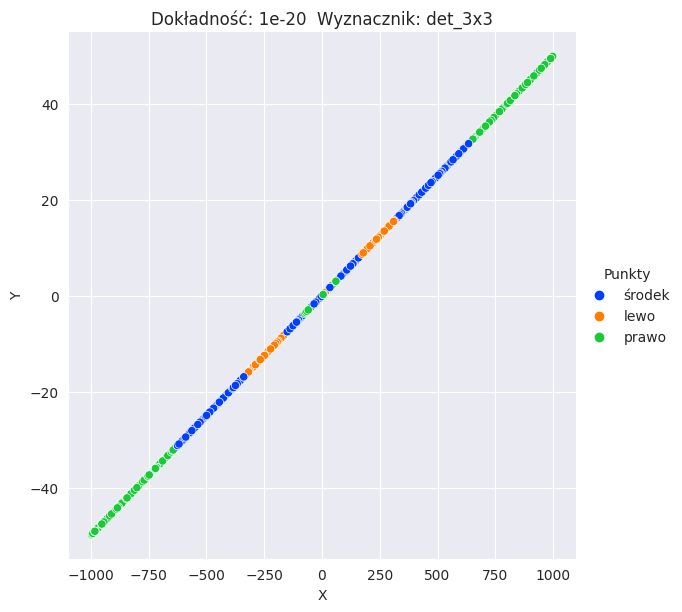

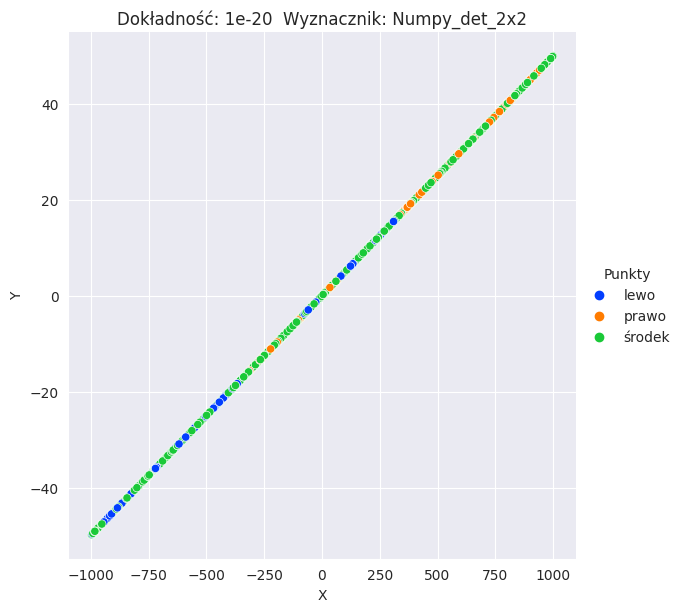

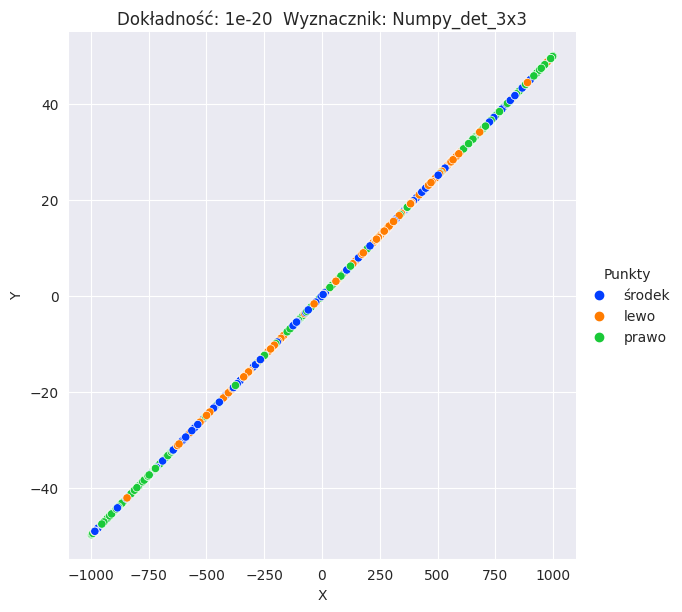

In [42]:
make_plots("Dane_d", table_d)

In [43]:
for i in range(len(epsilon)):
    df = pd.read_csv("Summary_e" + str(i)+ ".csv", index_col='Punkty')
    print(df.head())
    print()
    os.system("rm Summary_e" + str(i) + ".csv")

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo          0        0              0              0
prawo         0        0              0              0
środek     1000     1000           1000           1000

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        146        0            157             16
prawo       152        0            153             97
środek      702     1000            690            887

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        153      186            161            367
prawo       158      378            161            355
środek      689      436            678            278

        det_2x2  det_3x3  Numpy_det_2x2  Numpy_det_3x3
Punkty                                                
lewo        153      186            161            367
prawo  